## Aggregation File 

In this notebook we aggregate the key components of the analysis that we are interested in. They are not meant to be running consecutively, but rather to be used as a reference for the overall analysis that takes place. 

Here is a list of data sources used in this notebook:
-  For global population data [1](https://ghsl.jrc.ec.europa.eu/download.php?ds=pop)
- For Country shape files  [2](https://gadm.org/index.html)
- For access to harmonized NTL visit [3](https://figshare.com/articles/dataset/Harmonization_of_DMSP_and_VIIRS_nighttime_light_data_from_1992-2018_at_the_global_scale/9828827/2?file=17626016)
- For access to global 1x1km GDP estimates visit [4](https://figshare.com/articles/dataset/Global_1_km_1_km_gridded_revised_real_gross_domestic_product_and_electricity_consumption_during_1992-2019_based_on_calibrated_nighttime_light_data/17004523/1?file=31456837)


Before running make sure to activate the environment via the following command:

source qgis_env/bin/activate




In [62]:
# Import relevant packages
import numpy as np
import pandas as pd
import random
import PIL
import rasterio
import shapefile
import geopandas as gpd
import matplotlib.pyplot as plt
from PIL import Image
from pyproj import Transformer
from rasterio import features
from rasterio.enums import Resampling
from rasterio.mask import mask, raster_geometry_mask
from rasterio.plot import show
from shapely.geometry import Polygon, MultiPolygon, mapping
from skimage.measure import block_reduce
from matplotlib.collections import PatchCollection
from matplotlib.colors import Normalize
from matplotlib.colors import LogNorm
from bridson import poisson_disc_samples
import matplotlib.patches as patches
import scienceplots 
import os 

First lets assess the NTL and GDP data at hand. 

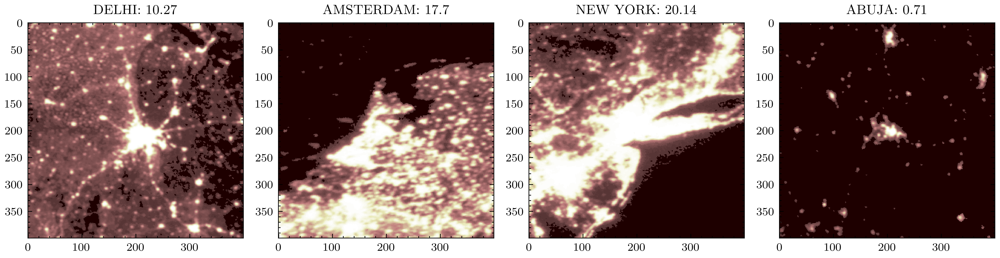

In [27]:
# Simple plot of NTL
fp = r'../Data_summary/NTL/Harmonized_DN_NTL_2008_calDMSP.tif'
img = rasterio.open(fp)

transformer = rasterio.transform.AffineTransformer(img.transform)
# Coordinates and buffer settings for cities
lat_long_dict = {
    "indian_ocean": (-11.78618, 67.47882),
    "equator": (0.0, 0.0),
    "amsterdam": (52.3676, 4.9041),
    "london": (51.5072, -0.1276),
    "new york": (40.7128, -74.006),
    "delhi": (28.7041, 77.1025),
    "abuja": (9.0765, 7.3986)
}
cities = ["delhi", "amsterdam", "new york", "abuja"]

# Function to get coordinates around a city
def get_coords_around_city(city_coords, buffer_pixels, img_transform):
    ys, xs = city_coords
    row, col = rasterio.transform.rowcol(img_transform, xs, ys)
    
    rows_to_find = np.arange(row-buffer_pixels, row+buffer_pixels)
    cols_to_find = np.arange(col-buffer_pixels, col+buffer_pixels)
    
    transformer = rasterio.transform.AffineTransformer(img_transform)
    return transformer.xy(rows_to_find, cols_to_find), (rows_to_find, cols_to_find)


def get_city_ntl_snapshot(city, buffer_pixels, lat_long_dict, img):
    (lons, lats), row_col = get_coords_around_city(lat_long_dict[city], buffer_pixels, img.transform)
    
    pts = []
    for lon in lons:
        for lat in lats:
            pts.append((lon, lat))
            
    new_img_array = []
    gen = rasterio.sample.sample_gen(img, pts)

    for _ in range(len(pts)):
        new_img_array.append(list(next(gen))[0])

    new_img_array = np.array(new_img_array)
    new_img_array = np.reshape(new_img_array, (buffer_pixels*2, buffer_pixels*2))
    new_img_array = np.flip(np.rot90(new_img_array, k=3), axis=1)
    
    return new_img_array

# Calculate the number of rows and columns for the subplot grid
num_cities = len(cities)
cols = 4  # You can choose how many columns you want
rows = num_cities // cols + (num_cities % cols > 0)

# Create a figure and a set of subplots
fig, axs = plt.subplots(rows, cols, figsize=(10, 10))  # Adjust figsize as needed

# Flatten the array of axes (for easy iteration)
axs = axs.flatten()

# Loop through the cities and plot each
for idx, city in enumerate(cities):
    buffer_pixels = 200
    new_img_array = get_city_ntl_snapshot(city, buffer_pixels, lat_long_dict, img)
    avg_radiance_val = round(np.average(new_img_array), 2)
    axs[idx].set_title(city.upper() + ": " + str(avg_radiance_val))
    axs[idx].imshow(new_img_array, cmap='pink')

# Hide any unused subplots
for idx in range(num_cities, len(axs)):
    axs[idx].axis('off')

# Adjust layout and save the entire figure
plt.tight_layout()
#plt.savefig("../data/pictures/ntl_viirs_combined.png", bbox_inches='tight')
plt.show()



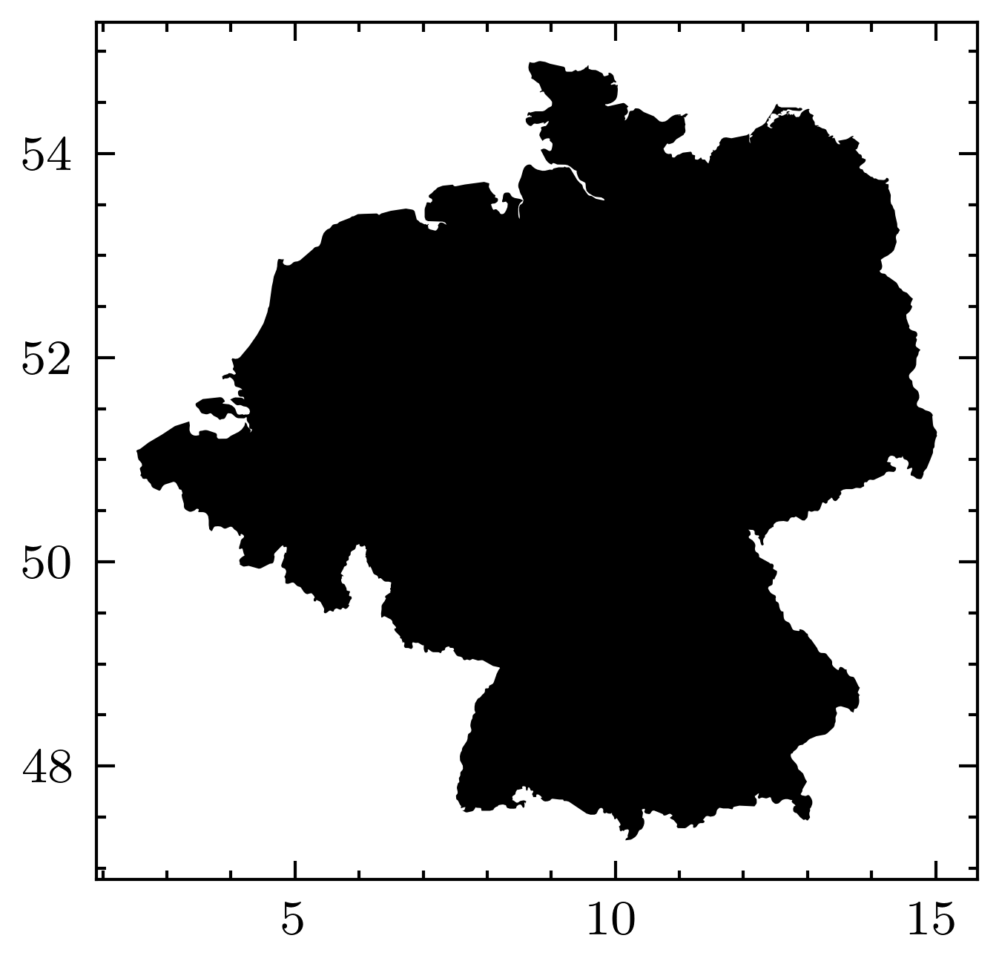

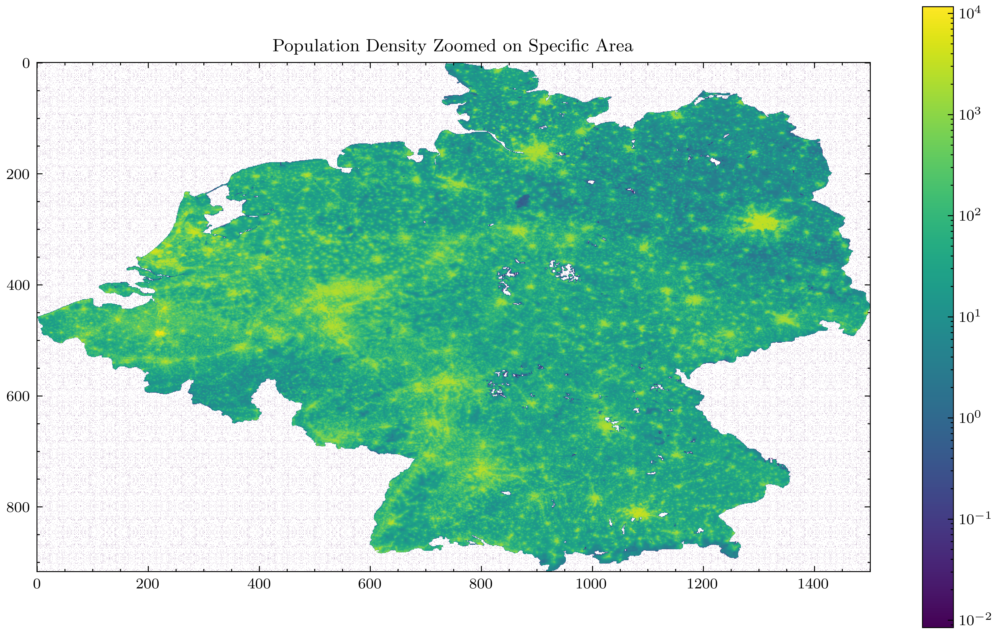

In [28]:
import geopandas as gpd
from shapely.geometry import MultiPolygon

def get_combined_country_geometry(country_codes):
    """
    Parameters:
    country_codes (list of str): List of country codes.
    Returns:
    geopandas.GeoDataFrame: GeoDataFrame containing the combined geometry for all specified countries, with CRS set.
    """
    # Load the country shapefile
    all_country_shapefile = gpd.read_file("../Data_summary/country_geometry/ne_10m_admin_0_sovereignty/ne_10m_admin_0_sovereignty.shp")
    
    # Filter the shapefile for the countries of interest
    filtered_countries = all_country_shapefile[all_country_shapefile['SOV_A3'].isin(country_codes)]
    
    # Initialize geom to None
    union_geom = None

    # Iterate through the filtered country geometries
    for _, row in filtered_countries.iterrows():
        country_geometry = row['geometry']

        # Handle MultiPolygon objects by selecting the largest polygon (by area)
        if isinstance(country_geometry, MultiPolygon):
            largest_polygon = max(country_geometry.geoms, key=lambda a: a.area)  # Use .geoms to access individual polygons
            country_geometry = largest_polygon

        # Combine geometries using union
        if union_geom is None:
            union_geom = country_geometry
        else:
            union_geom = union_geom.union(country_geometry)

    # Create a GeoDataFrame to return
    combined_geo_df = gpd.GeoDataFrame(geometry=[union_geom], crs=filtered_countries.crs)
    return combined_geo_df


def visualize_geometry(geometry):
    """
    Visualizes any geometry given either a Shapely geometry or a Geopandas GeoDataFrame.

    Parameters:
    geometry (shapely.geometry or geopandas.GeoDataFrame): Geometry to visualize.
    """
    if isinstance(geometry, gpd.GeoDataFrame):
        # If it's already a GeoDataFrame, plot directly
        geometry.plot()
        plt.show()
    elif hasattr(geometry, 'geom_type'):
        # If it's a Shapely geometry, create a GeoDataFrame for visualization
        gdf = gpd.GeoDataFrame(index=[0], geometry=[geometry], crs='epsg:4326')
        gdf.plot()
        plt.show()
    else:
        raise TypeError("Unsupported geometry type provided.")

def get_pop_density_for_geodf(combined_geometry):
    raster_path = "../Data_summary/POP/ppp_2005_1km_Aggregated.tif"
    output_raster_path = "../Data_summary/POP/selection.tif"
    
    with rasterio.open(raster_path) as src:
        if combined_geometry.crs != src.crs:
            combined_geometry = combined_geometry.to_crs(src.crs)
        
        # Masking operation
        out_image, out_transform = mask(src, combined_geometry.geometry, crop=True)
        
        # Update metadata
        out_meta = src.meta.copy()
        out_meta.update({"driver": "GTiff", "height": out_image.shape[1],
                         "width": out_image.shape[2], "transform": out_transform,
                         "crs": src.crs})

        with rasterio.open(output_raster_path, "w", **out_meta) as dest:
            dest.write(out_image)

def plot_pop_density():
    fp = r'../Data_summary/POP/selection.tif'
        
    with rasterio.open(fp) as shapefile:
        # Read the data
        subset = shapefile.read(1)
        subset[subset < 0] = 0
        # Plot the subset with enhanced visibility of maxima
        plt.figure(figsize=(10, 6))
        plt.imshow(subset, cmap='viridis', norm=LogNorm(vmin=subset[subset > 0].min(), vmax=subset.max()))
        plt.colorbar()
        plt.title("Population Density Zoomed on Specific Area")
        plt.show()

# Example Usage
country_codes = ["NL1", "BEL", "DEU"]
combined_geo_df = get_combined_country_geometry(country_codes)
visualize_geometry(combined_geo_df) 
get_pop_density_for_geodf(combined_geo_df)
plot_pop_density()




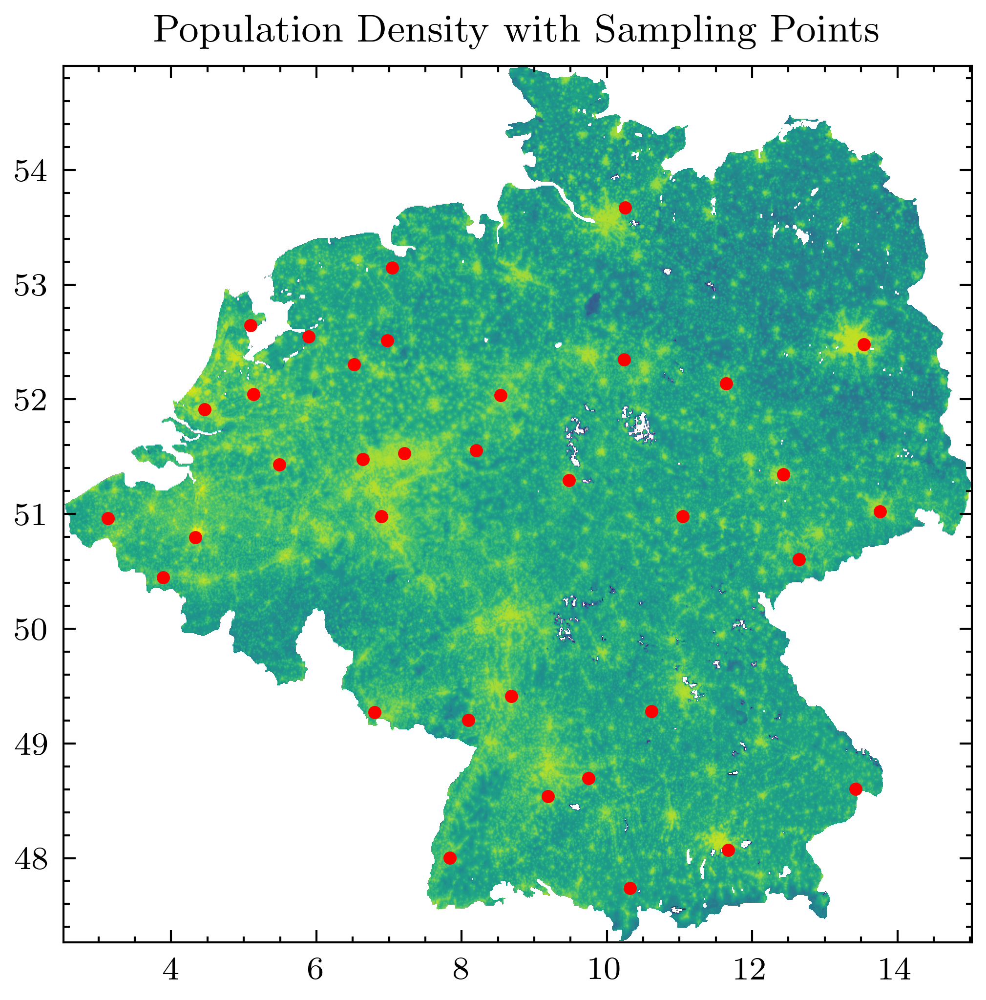

In [29]:
import rasterio
import geopandas as gpd
import numpy as np
from shapely.geometry import Point
import pyproj
from scipy.spatial import cKDTree


def raster_to_spatial_probability_distribution(raster_path, power=1):
    """
    Converts raster data to a spatial probability distribution, giving more weight to higher densities.
    
    Parameters:
    raster_path (str): Path to the raster file containing data (e.g., population density).
    power (float): The power to raise each raster value to before normalizing. Defaults to 2.

    Returns:
    geopandas.GeoDataFrame: GeoDataFrame containing probability values and corresponding geometries.
    """
    with rasterio.open(raster_path) as src:
        # Read the data, ensuring no negative values
        raster_data = src.read(1, masked=True)
        raster_data.fill_value = 0
        raster_data = raster_data.filled()

        # Apply a power transformation to emphasize higher densities
        raster_data = np.power(raster_data, power)

        # Calculate probabilities
        total_sum = raster_data.sum()
        if total_sum == 0:
            raise ValueError("The sum of the raster values is 0; cannot form a probability distribution.")
        probability_distribution = raster_data / total_sum

        # Convert raster to points with probability
        coords = [(x, y) for y, row in enumerate(probability_distribution) 
                          for x, val in enumerate(row) if val > 0]
        values = [probability_distribution[y, x] for x, y in coords]
        
        geometry = [Point(src.xy(y, x)) for x, y in coords]  # Convert coords to points with spatial reference

        # Create a GeoDataFrame
        gdf = gpd.GeoDataFrame({'probability': values, 'geometry': geometry}, crs=src.crs)
        return gdf


def poisson_disk_sampling_with_geodf(geo_df, radius, n_samples=100):
    """
    Perform Poisson disk sampling on a geospatial DataFrame,
    with a minimum radius between points, influenced by a spatial probability distribution.

    Parameters:
    radius (float): Minimum distance between samples.
    geo_df (geopandas.GeoDataFrame): GeoDataFrame containing point geometries and their probabilities.
    n_samples (int): Max number of samples to generate, each at least `radius` apart

    Returns:
    geopandas.GeoDataFrame: GeoDataFrame of the sampled points.
    """
    # Sample initial points based on weighted probability
    initial_points = geo_df.sample(n=n_samples, weights='probability', replace=True)
    
    points_array = np.array([[point.x, point.y] for point in initial_points.geometry])
    tree = cKDTree(points_array)
    
    # Filter points based on radius
    valid_points = []
    indices_to_remove = set()

    for i in range(len(points_array)):
        if i in indices_to_remove:
            continue
        # Points within the radius including the point itself
        indices = tree.query_ball_point(points_array[i], radius)
        # Remove the point itself from the set
        indices.remove(i)
        # Update indices to remove with the neighbors, keeping only the first point
        indices_to_remove.update(indices)
        # Add the valid point (non-removed point)
        valid_points.append(initial_points.iloc[i])

    # Convert list of points to GeoDataFrame
    return gpd.GeoDataFrame(geometry=[point.geometry for point in valid_points], crs=geo_df.crs)



def visualize_with_population(points_gdf, raster_path):
    fig, ax = plt.subplots(figsize=(4, 4))
    with rasterio.open(raster_path) as raster:
        # Display the raster data with logarithmic normalization using LogNorm
        rasterio.plot.show(raster, ax=ax, cmap='viridis', norm=LogNorm(), title="Population Density with Sampling Points")
    
    # Plot the points on top of the raster
    points_gdf.plot(ax=ax, color='red', markersize=5)  # Plot sampled points

    plt.show()




# Usage Example
raster_path = '../Data_summary/POP/selection.tif'
probability_gdf = raster_to_spatial_probability_distribution(raster_path, power=2)
sampled_points = poisson_disk_sampling_with_geodf(probability_gdf, radius=0.5, n_samples=100)
# Visualize
visualize_with_population(sampled_points, raster_path)

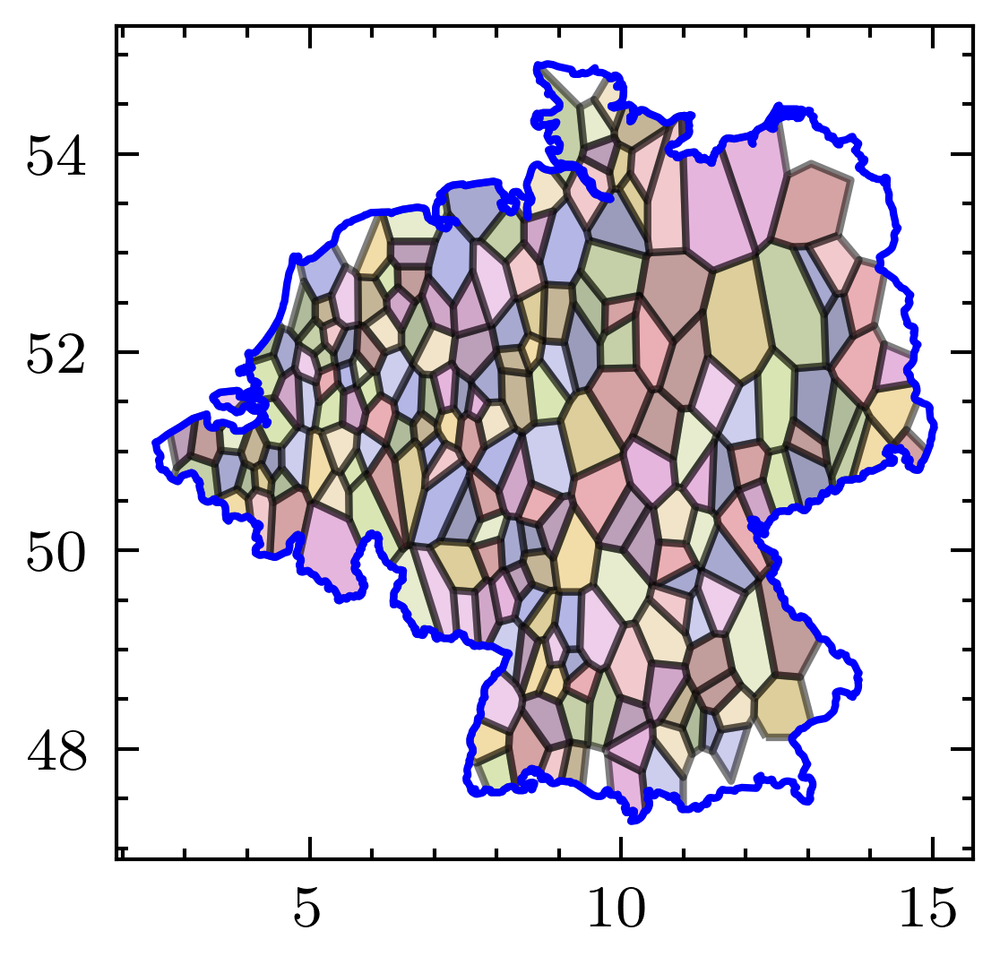

213


In [30]:
import geopandas as gpd
import numpy as np
from shapely.geometry import Polygon, Point
from scipy.spatial import Voronoi
import matplotlib.pyplot as plt

def create_voronoi_gdf(points_gdf, boundary):
    """
    Creates a GeoDataFrame containing Voronoi polygons clipped by a specified boundary.

    Parameters:
    points_gdf (geopandas.GeoDataFrame): GeoDataFrame containing point geometries.
    boundary (shapely.geometry): Boundary geometry within which to clip the Voronoi diagram.

    Returns:
    geopandas.GeoDataFrame: GeoDataFrame containing bounded Voronoi polygons with the same CRS as the input.
    """
    # Ensure that points_gdf has a valid CRS and extract coordinates
    if points_gdf.crs is None:
        raise ValueError("Input points GeoDataFrame must have a defined CRS.")

    # Extracting x, y coordinates from the points GeoDataFrame
    points = np.array([[point.x, point.y] for point in points_gdf.geometry])
    
    # Generate Voronoi diagram
    vor = Voronoi(points)
    
    # Create polygons for each Voronoi region
    polygons = []
    for region_index in vor.point_region:
        vertices = vor.regions[region_index]
        if all(v >= 0 for v in vertices):  # Check if the region is fully bounded
            polygon = Polygon(vor.vertices[vertices])
            # Clip the polygon with the boundary
            clipped_polygon = polygon.intersection(boundary)
            if not clipped_polygon.is_empty:
                polygons.append(clipped_polygon)

    # Create a GeoDataFrame with the same CRS as the input points
    voronoi_gdf = gpd.GeoDataFrame(geometry=polygons, crs=points_gdf.crs)
    return voronoi_gdf

def visualize_voronoi(voronoi_gdf, boundary):
    """
    Visualizes the Voronoi GeoDataFrame alongside the boundary.

    Parameters:
    voronoi_gdf (geopandas.GeoDataFrame): GeoDataFrame of the Voronoi polygons.
    boundary (shapely.geometry): Boundary geometry used for clipping.
    """
    fig, ax = plt.subplots(figsize=(2,2))
    plt.style.use(['science','ieee'])
    boundary_gdf = gpd.GeoDataFrame(geometry=[boundary], crs="EPSG:4326")
    boundary_gdf.boundary.plot(ax=ax, color="blue", linewidth=1)
    voronoi_gdf.plot(ax=ax, alpha=0.5, edgecolor='black', cmap='tab20b')
    plt.tight_layout()
    plt.show()

# Example usage
country_codes = ["NL1", "BEL", "DEU"]
boundary =   get_combined_country_geometry(country_codes).geometry[0]
points =  poisson_disk_sampling_with_geodf(probability_gdf, radius=0.2, n_samples=1000)
bounded_voronoi_gdf = create_voronoi_gdf(points, boundary)
visualize_voronoi(bounded_voronoi_gdf, boundary)
print(len(bounded_voronoi_gdf))


In [50]:
import rasterio
from rasterio.plot import show
import geopandas as gpd
from shapely.geometry import Point

def raster_to_population_gdf(raster_path):
    """
    Converts raster population data to a GeoDataFrame without normalizing to a probability distribution.

    Parameters:
    raster_path (str): Path to the raster file containing population data.

    Returns:
    geopandas.GeoDataFrame: GeoDataFrame containing population values and corresponding geometries.
    """
    with rasterio.open(raster_path) as src:
        # Read the data, ensuring no negative values
        raster_data = src.read(1, masked=True)
        raster_data.fill_value = 0
        raster_data = raster_data.filled()

        # Ensure there's data to process
        if raster_data.sum() == 0:
            raise ValueError("The sum of the raster values is 0; no valid data.")

        # Extract non-zero population data points
        coords = [(x, y) for y, row in enumerate(raster_data) 
                  for x, val in enumerate(row) if val > 0]
        values = [raster_data[y, x] for x, y in coords]

        # Convert array indices to spatial coordinates and create points
        geometry = [Point(src.xy(y, x)) for x, y in coords]

        # Create a GeoDataFrame
        gdf = gpd.GeoDataFrame({'population': values, 'geometry': geometry}, crs=src.crs)
        return gdf
    
# def attribute_values_to_voronoi_cells(voronoi_gdf, raster_gdf, value_name):
#     """
#     Attributes a value to each Voronoi cell based on the sum of values from a given raster GeoDataFrame.

#     Parameters:
#     voronoi_gdf (geopandas.GeoDataFrame): GeoDataFrame containing Voronoi polygons.
#     raster_gdf (geopandas.GeoDataFrame): GeoDataFrame containing values and points from a raster.
#     value_name (str): Name for the attributed value.

#     Returns:
#     geopandas.GeoDataFrame: Updated GeoDataFrame where each Voronoi cell has an attributed sum value.
#     """
#     # Ensure the coordinate reference systems match
#     if voronoi_gdf.crs != raster_gdf.crs:
#         raster_gdf = raster_gdf.to_crs(voronoi_gdf.crs)

#     # Spatial join to find which raster points fall within each Voronoi cell
#     joined_gdf = gpd.sjoin(voronoi_gdf, raster_gdf, how="left", op='contains')

#     # Sum the values of the raster points within each Voronoi cell and rename the column
#     summed_values = joined_gdf.groupby(joined_gdf.index)[value_name].sum().rename(value_name)

#     # Merge the summed values back into the original Voronoi GeoDataFrame
#     voronoi_gdf = voronoi_gdf.merge(summed_values, left_index=True, right_index=True, how='left')

#     # Fill NaN values with 0 if there are any cells without any raster points
#     voronoi_gdf[value_name].fillna(0, inplace=True)

#     return voronoi_gdf

def attribute_values_to_voronoi_cells(voronoi_gdf, raster_gdf, value_name):
    """
    Attributes a value to each Voronoi cell based on the sum of values from a given raster GeoDataFrame.

    Parameters:
    voronoi_gdf (geopandas.GeoDataFrame): GeoDataFrame containing Voronoi polygons.
    raster_gdf (geopandas.GeoDataFrame): GeoDataFrame containing values and points from a raster.
    value_name (str): Name for the attributed value, which must be present in raster_gdf.

    Returns:
    geopandas.GeoDataFrame: Updated GeoDataFrame where each Voronoi cell has an attributed sum value.
    """
    # Ensure the coordinate reference systems match
    if voronoi_gdf.crs != raster_gdf.crs:
        raster_gdf = raster_gdf.to_crs(voronoi_gdf.crs)

    # Spatial join to find which raster points fall within each Voronoi cell
    joined_gdf = gpd.sjoin(voronoi_gdf, raster_gdf, how="left", op='contains')

    #print colum names
    print(joined_gdf.columns)
    # Check if the value_name is actually in the joined_gdf columns
    if value_name not in joined_gdf.columns:
        raise ValueError(f"The column {value_name} was not found in the joined GeoDataFrame.")

    # Sum the values of the raster points within each Voronoi cell
    summed_values = joined_gdf.groupby(joined_gdf.index)[value_name].sum().rename(value_name)

    # Merge the summed values back into the original Voronoi GeoDataFrame
    voronoi_gdf = voronoi_gdf.merge(summed_values, left_index=True, right_index=True, how='left')

    # Fill NaN values with 0 if there are any cells without any raster points
    voronoi_gdf[value_name].fillna(0, inplace=True)

    return voronoi_gdf




def plot_voronoi_histogram(voronoi_gdf):
    """
    Plots histograms of all cell properties attributed to each Voronoi cell.

    Parameters:
    voronoi_gdf (geopandas.GeoDataFrame): GeoDataFrame containing Voronoi polygons with attributed values.
    """
    # Get all column names except the geometry column
    property_names = [col for col in voronoi_gdf.columns if col != voronoi_gdf.geometry.name]

    # Determine the number of subplots required
    num_properties = len(property_names)
    num_rows = (num_properties // 2) + (num_properties % 2)  # Calculate number of rows for subplots
    num_cols = 2 # Two columns for subplots

    # Create subplots
    fig, axs = plt.subplots(num_rows, num_cols, figsize=(5, 5))
    fig.tight_layout(pad=4.0)

    # Flatten the axs array if num_properties is less than num_rows * num_cols
    axs = axs.flatten()

    # Plot histograms for each property
    for i, prop_name in enumerate(property_names):
        # Plot histogram
        axs[i].hist(voronoi_gdf[prop_name], bins=20, color='skyblue', edgecolor='black')
        axs[i].set_xlabel(prop_name.capitalize())
        axs[i].set_ylabel('Frequency')
        axs[i].set_title(f'Histogram of {prop_name.capitalize()} for Voronoi Cells')
        axs[i].grid(True)

    # Hide empty subplots
    for j in range(i+1, len(axs)):
        axs[j].axis('off')

    plt.show()



In [52]:
raster_path = '../Data_summary/POP/selection.tif'
population_gdf = raster_to_population_gdf(raster_path)
points =  poisson_disk_sampling_with_geodf(probability_gdf, radius=0.1, n_samples=1000)
voronoi_gdf = create_voronoi_gdf(points, boundary) 
attributed_voronoi_gdf = attribute_values_to_voronoi_cells(voronoi_gdf, population_gdf, 'population')
# plot_voronoi_histogram(attributed_voronoi_gdf)
# visualize_voronoi(attributed_voronoi_gdf, boundary)

/Users/mengeshi/Library/Python/3.11/lib/python/site-packages/IPython/core/interactiveshell.py:3577: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


Index(['geometry', 'index_right', 'population'], dtype='object')


In [63]:
def raster_to_gdf(raster_path, name='value'):
    """
    Converts raster population data to a GeoDataFrame without normalizing to a probability distribution.

    Parameters:
    raster_path (str): Path to the raster file containing population data.

    Returns:
    geopandas.GeoDataFrame: GeoDataFrame containing population values and corresponding geometries.
    """
    with rasterio.open(raster_path) as src:
        # Read the data, ensuring no negative values
        raster_data = src.read(1, masked=True)
        raster_data.fill_value = 0
        raster_data = raster_data.filled()

        # Ensure there's data to process
        if raster_data.sum() == 0:
            raise ValueError("The sum of the raster values is 0; no valid data.")

        # Extract non-zero population data points
        coords = [(x, y) for y, row in enumerate(raster_data) 
                  for x, val in enumerate(row) if val > 0]
        values = [raster_data[y, x] for x, y in coords]

        # Convert array indices to spatial coordinates and create points
        geometry = [Point(src.xy(y, x)) for x, y in coords]

        # Create a GeoDataFrame
        gdf = gpd.GeoDataFrame({name: values, 'geometry': geometry}, crs=src.crs)
        return gdf

def selection_of_tif_for_geodf(combined_geometry, raster_path, output_raster_path):

    with rasterio.open(raster_path) as src:
        if combined_geometry.crs != src.crs:
            combined_geometry = combined_geometry.to_crs(src.crs)
        
        # Masking operation
        out_image, out_transform = mask(src, combined_geometry.geometry, crop=True)
        
        # Update metadata
        out_meta = src.meta.copy()
        out_meta.update({"driver": "GTiff", "height": out_image.shape[1],
                         "width": out_image.shape[2], "transform": out_transform,
                         "crs": src.crs})

        with rasterio.open(output_raster_path, "w", **out_meta) as dest:
            dest.write(out_image)

def save_tessellation_data(points, attributed_voronoi_gdf, run_number=1):
    """
    Saves the GeoDataFrame containing attributed data and the points used for tessellation.
    
    Parameters:
    points (geopandas.GeoDataFrame): GeoDataFrame of points used for tessellation.
    attributed_voronoi_gdf (geopandas.GeoDataFrame): Attributed GeoDataFrame of Voronoi polygons.
    run_number (int): Optional; a counting number to differentiate outputs, default is 1.
    """
    # Ensure the directories exist
    os.makedirs('../Data_summary/Tesselations', exist_ok=True)
    
    # Save the complete GeoDataFrame with all years' data
    output_path = f'../Data_summary/Tesselations/attributed_voronoi_all_years_{run_number}.geojson'
    attributed_voronoi_gdf.to_file(output_path, driver='GeoJSON')

    # Save the points used for the tessellation
    points_output_path = f'../Data_summary/Tesselations/tessellation_points_{run_number}.geojson'
    points.to_file(points_output_path, driver='GeoJSON')


            
# country_codes = ["NL1", "BEL", "DEU"]
# combined_geo_df = get_combined_country_geometry(country_codes)
# raster_path = '../Data_summary/GDP/2015/2015GDP.tif'
# output_raster_path = '../Data_summary/POP/gdp_selection.tif'
# selection_of_tif_for_geodf(combined_geo_df, raster_path, output_raster_path)
# gdp_gdf = raster_to_gdf('../Data_summary/POP/gdp_selection.tif', name='gdp')
# #show properties of gdp_gdf
# print(gdp_gdf.head())


In [65]:
country_codes = ["NL1", "BEL", "DEU"]
combined_geo_df = get_combined_country_geometry(country_codes)
get_pop_density_for_geodf(combined_geo_df)
pop_raster_path = '../Data_summary/POP/selection.tif'

population_gdf = raster_to_population_gdf(pop_raster_path)
probability_gdf = raster_to_spatial_probability_distribution(pop_raster_path, power=2)

points =  poisson_disk_sampling_with_geodf(probability_gdf, radius=0.1, n_samples=1000)
voronoi_gdf = create_voronoi_gdf(points, boundary) 
attributed_voronoi_gdf = attribute_values_to_voronoi_cells(voronoi_gdf, population_gdf, 'population')

/Users/mengeshi/Library/Python/3.11/lib/python/site-packages/IPython/core/interactiveshell.py:3577: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


Index(['geometry', 'index_right', 'population'], dtype='object')


In [67]:
# List of years to process
years = list(range(1993, 2020))


# Loop over each year to process GDP data
for year in years:
    raster_path = f'../Data_summary/GDP/{year}/{year}GDP.tif'
    output_raster_path = f'../Data_summary/POP/gdp_selection_{year}.tif'
    selection_of_tif_for_geodf(combined_geo_df, raster_path, output_raster_path)
    gdp_gdf = raster_to_gdf(output_raster_path, name=f'gdp_{year}')
    gdp_value_name = f'gdp_{year}'  # Dynamic column name for the GDP data

    attributed_voronoi_gdf = attribute_values_to_voronoi_cells(attributed_voronoi_gdf, gdp_gdf, gdp_value_name)


#print number of attributes of cells
print(len(attributed_voronoi_gdf))
#pick one cell and print number of properties
print(attributed_voronoi_gdf.iloc[50])




/Users/mengeshi/Library/Python/3.11/lib/python/site-packages/IPython/core/interactiveshell.py:3577: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


Index(['geometry', 'population', 'gdp_1993', 'gdp_1994', 'gdp_1995',
       'gdp_1996', 'gdp_1997', 'gdp_1998', 'gdp_1999', 'gdp_2000', 'gdp_2001',
       'gdp_2002', 'gdp_2003', 'gdp_2004', 'index_right', 'gdp_2005'],
      dtype='object')


/Users/mengeshi/Library/Python/3.11/lib/python/site-packages/IPython/core/interactiveshell.py:3577: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


Index(['geometry', 'population', 'gdp_1993', 'gdp_1994', 'gdp_1995',
       'gdp_1996', 'gdp_1997', 'gdp_1998', 'gdp_1999', 'gdp_2000', 'gdp_2001',
       'gdp_2002', 'gdp_2003', 'gdp_2004', 'gdp_2005', 'index_right',
       'gdp_2006'],
      dtype='object')


/Users/mengeshi/Library/Python/3.11/lib/python/site-packages/IPython/core/interactiveshell.py:3577: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


Index(['geometry', 'population', 'gdp_1993', 'gdp_1994', 'gdp_1995',
       'gdp_1996', 'gdp_1997', 'gdp_1998', 'gdp_1999', 'gdp_2000', 'gdp_2001',
       'gdp_2002', 'gdp_2003', 'gdp_2004', 'gdp_2005', 'gdp_2006',
       'index_right', 'gdp_2007'],
      dtype='object')


/Users/mengeshi/Library/Python/3.11/lib/python/site-packages/IPython/core/interactiveshell.py:3577: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


Index(['geometry', 'population', 'gdp_1993', 'gdp_1994', 'gdp_1995',
       'gdp_1996', 'gdp_1997', 'gdp_1998', 'gdp_1999', 'gdp_2000', 'gdp_2001',
       'gdp_2002', 'gdp_2003', 'gdp_2004', 'gdp_2005', 'gdp_2006', 'gdp_2007',
       'index_right', 'gdp_2008'],
      dtype='object')


/Users/mengeshi/Library/Python/3.11/lib/python/site-packages/IPython/core/interactiveshell.py:3577: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


Index(['geometry', 'population', 'gdp_1993', 'gdp_1994', 'gdp_1995',
       'gdp_1996', 'gdp_1997', 'gdp_1998', 'gdp_1999', 'gdp_2000', 'gdp_2001',
       'gdp_2002', 'gdp_2003', 'gdp_2004', 'gdp_2005', 'gdp_2006', 'gdp_2007',
       'gdp_2008', 'index_right', 'gdp_2009'],
      dtype='object')


/Users/mengeshi/Library/Python/3.11/lib/python/site-packages/IPython/core/interactiveshell.py:3577: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


Index(['geometry', 'population', 'gdp_1993', 'gdp_1994', 'gdp_1995',
       'gdp_1996', 'gdp_1997', 'gdp_1998', 'gdp_1999', 'gdp_2000', 'gdp_2001',
       'gdp_2002', 'gdp_2003', 'gdp_2004', 'gdp_2005', 'gdp_2006', 'gdp_2007',
       'gdp_2008', 'gdp_2009', 'index_right', 'gdp_2010'],
      dtype='object')


/Users/mengeshi/Library/Python/3.11/lib/python/site-packages/IPython/core/interactiveshell.py:3577: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


Index(['geometry', 'population', 'gdp_1993', 'gdp_1994', 'gdp_1995',
       'gdp_1996', 'gdp_1997', 'gdp_1998', 'gdp_1999', 'gdp_2000', 'gdp_2001',
       'gdp_2002', 'gdp_2003', 'gdp_2004', 'gdp_2005', 'gdp_2006', 'gdp_2007',
       'gdp_2008', 'gdp_2009', 'gdp_2010', 'index_right', 'gdp_2011'],
      dtype='object')


/Users/mengeshi/Library/Python/3.11/lib/python/site-packages/IPython/core/interactiveshell.py:3577: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


Index(['geometry', 'population', 'gdp_1993', 'gdp_1994', 'gdp_1995',
       'gdp_1996', 'gdp_1997', 'gdp_1998', 'gdp_1999', 'gdp_2000', 'gdp_2001',
       'gdp_2002', 'gdp_2003', 'gdp_2004', 'gdp_2005', 'gdp_2006', 'gdp_2007',
       'gdp_2008', 'gdp_2009', 'gdp_2010', 'gdp_2011', 'index_right',
       'gdp_2012'],
      dtype='object')


/Users/mengeshi/Library/Python/3.11/lib/python/site-packages/IPython/core/interactiveshell.py:3577: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


Index(['geometry', 'population', 'gdp_1993', 'gdp_1994', 'gdp_1995',
       'gdp_1996', 'gdp_1997', 'gdp_1998', 'gdp_1999', 'gdp_2000', 'gdp_2001',
       'gdp_2002', 'gdp_2003', 'gdp_2004', 'gdp_2005', 'gdp_2006', 'gdp_2007',
       'gdp_2008', 'gdp_2009', 'gdp_2010', 'gdp_2011', 'gdp_2012',
       'index_right', 'gdp_2013'],
      dtype='object')


/Users/mengeshi/Library/Python/3.11/lib/python/site-packages/IPython/core/interactiveshell.py:3577: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


Index(['geometry', 'population', 'gdp_1993', 'gdp_1994', 'gdp_1995',
       'gdp_1996', 'gdp_1997', 'gdp_1998', 'gdp_1999', 'gdp_2000', 'gdp_2001',
       'gdp_2002', 'gdp_2003', 'gdp_2004', 'gdp_2005', 'gdp_2006', 'gdp_2007',
       'gdp_2008', 'gdp_2009', 'gdp_2010', 'gdp_2011', 'gdp_2012', 'gdp_2013',
       'index_right', 'gdp_2014'],
      dtype='object')


/Users/mengeshi/Library/Python/3.11/lib/python/site-packages/IPython/core/interactiveshell.py:3577: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


Index(['geometry', 'population', 'gdp_1993', 'gdp_1994', 'gdp_1995',
       'gdp_1996', 'gdp_1997', 'gdp_1998', 'gdp_1999', 'gdp_2000', 'gdp_2001',
       'gdp_2002', 'gdp_2003', 'gdp_2004', 'gdp_2005', 'gdp_2006', 'gdp_2007',
       'gdp_2008', 'gdp_2009', 'gdp_2010', 'gdp_2011', 'gdp_2012', 'gdp_2013',
       'gdp_2014', 'index_right', 'gdp_2015'],
      dtype='object')


/Users/mengeshi/Library/Python/3.11/lib/python/site-packages/IPython/core/interactiveshell.py:3577: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


Index(['geometry', 'population', 'gdp_1993', 'gdp_1994', 'gdp_1995',
       'gdp_1996', 'gdp_1997', 'gdp_1998', 'gdp_1999', 'gdp_2000', 'gdp_2001',
       'gdp_2002', 'gdp_2003', 'gdp_2004', 'gdp_2005', 'gdp_2006', 'gdp_2007',
       'gdp_2008', 'gdp_2009', 'gdp_2010', 'gdp_2011', 'gdp_2012', 'gdp_2013',
       'gdp_2014', 'gdp_2015', 'index_right', 'gdp_2016'],
      dtype='object')


/Users/mengeshi/Library/Python/3.11/lib/python/site-packages/IPython/core/interactiveshell.py:3577: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


Index(['geometry', 'population', 'gdp_1993', 'gdp_1994', 'gdp_1995',
       'gdp_1996', 'gdp_1997', 'gdp_1998', 'gdp_1999', 'gdp_2000', 'gdp_2001',
       'gdp_2002', 'gdp_2003', 'gdp_2004', 'gdp_2005', 'gdp_2006', 'gdp_2007',
       'gdp_2008', 'gdp_2009', 'gdp_2010', 'gdp_2011', 'gdp_2012', 'gdp_2013',
       'gdp_2014', 'gdp_2015', 'gdp_2016', 'index_right', 'gdp_2017'],
      dtype='object')


/Users/mengeshi/Library/Python/3.11/lib/python/site-packages/IPython/core/interactiveshell.py:3577: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


Index(['geometry', 'population', 'gdp_1993', 'gdp_1994', 'gdp_1995',
       'gdp_1996', 'gdp_1997', 'gdp_1998', 'gdp_1999', 'gdp_2000', 'gdp_2001',
       'gdp_2002', 'gdp_2003', 'gdp_2004', 'gdp_2005', 'gdp_2006', 'gdp_2007',
       'gdp_2008', 'gdp_2009', 'gdp_2010', 'gdp_2011', 'gdp_2012', 'gdp_2013',
       'gdp_2014', 'gdp_2015', 'gdp_2016', 'gdp_2017', 'index_right',
       'gdp_2018'],
      dtype='object')


/Users/mengeshi/Library/Python/3.11/lib/python/site-packages/IPython/core/interactiveshell.py:3577: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


Index(['geometry', 'population', 'gdp_1993', 'gdp_1994', 'gdp_1995',
       'gdp_1996', 'gdp_1997', 'gdp_1998', 'gdp_1999', 'gdp_2000', 'gdp_2001',
       'gdp_2002', 'gdp_2003', 'gdp_2004', 'gdp_2005', 'gdp_2006', 'gdp_2007',
       'gdp_2008', 'gdp_2009', 'gdp_2010', 'gdp_2011', 'gdp_2012', 'gdp_2013',
       'gdp_2014', 'gdp_2015', 'gdp_2016', 'gdp_2017', 'gdp_2018',
       'index_right', 'gdp_2019'],
      dtype='object')
325
geometry      POLYGON ((10.039486015446201 48.8797102427428,...
population                                         426939.34375
gdp_1993                                           17719.814453
gdp_1994                                           18330.117188
gdp_1995                                           18693.498047
gdp_1996                                             18997.6875
gdp_1997                                           19361.070312
gdp_1998                                           19794.998047
gdp_1999                                           202

In [68]:
# Example usage:
# Assuming `points` and `attributed_voronoi_gdf` are already defined and ready to be saved
save_tessellation_data(points, attributed_voronoi_gdf)

